In [1]:
import pandas as pd
import random as rd
from faker import Faker
pd.set_option('display.max_columns', 500)

In [2]:
var = ['nombre','apellido_p','apellido_m','id_cliente','edad','genero','soltero','casado','viudo','divorciado',
'num_transacciones_mes','num_transacciones_quincena','tot_transacciones_anio','cant_transacciones_mes','cant_transacciones_quincena','cant_tot_transacciones_anio',
'num_transacciones_medicas_mes','num_transacciones_medicas_quincena','tot_transacciones_medicas_anio','cant_transacciones_medicas_mes','cant_transacciones_medicas_quincena','cant_tot_transacciones_medicas_anio',
'ingresos_tot','gastos_tot','ingresos_mes','gastos_mes','gastomed_vs_gasto','gastomed_vs_ingreso',
'num_transacciones_dvisual','num_transacciones_dauditiva','num_transacciones_dmotriz','cant_transacciones_dvisual','cant_transacciones_dauditiva','cant_transacciones_dmotriz',
'flag_sgmm',
'flag_relmedica',
'flag_discapacidad',
'flag_amayor',
'flag_dvisual',
'flag_dmotriz',
'flag_dauditivo']

varc = ['edad',
'num_transacciones_mes','num_transacciones_quincena','tot_transacciones_anio','cant_transacciones_mes','cant_transacciones_quincena','cant_tot_transacciones_anio',
'num_transacciones_medicas_mes','num_transacciones_medicas_quincena','tot_transacciones_medicas_anio','cant_transacciones_medicas_mes','cant_transacciones_medicas_quincena','cant_tot_transacciones_medicas_anio',
'ingresos_tot','gastos_tot','ingresos_mes','gastos_mes','gastomed_vs_gasto','gastomed_vs_ingreso',
'num_transacciones_dvisual','num_transacciones_dauditiva','num_transacciones_dmotriz','cant_transacciones_dvisual','cant_transacciones_dauditiva','cant_transacciones_dmotriz']

In [3]:
def ceros(x):
    r = [0 for i in range(x)]
    return r
    
def num_trans(x):
    r = [rd.choice(range(0,80001)) for i in range(x)]
    return r
    
def cant_trans(x):
    r = [rd.choice(range(100,5000001)) for i in range(x)]
    return r

def ingr_gast(x):
    r = [rd.choice(range(500000,5000001)) for i in range(x)]
    return r

def num_tran_med(x):
    r = [rd.choice(range(0,500000)) for i in range(x)]
    return r

def tot_trans(x):
    r = [rd.choice(range(50,500000)) for i in range(x)]
    return r

def flags(x,y,n):
    r = [rd.choices([0,1],weights = [x,y]) for i in range(n)]
    s = [i[0] for i in r]
    return s

fake = Faker()

In [4]:
df = pd.DataFrame(columns = var)

In [5]:
df['id_cliente'] = [i for i in range(50000)]
df['nombre']     = [fake.first_name() for i in range(50000)]
df['apellido_p'] = [fake.last_name() for i in range(50000)]
df['apellido_m'] =  [fake.last_name() for i in range(50000)]
df['edad']       = [rd.choice(range(18,60)) for i in range(41000)] + [rd.choice(range(60,86)) for i in range(9000)]
df['genero']     = flags(.55,.45,50000) 

df['soltero']    = flags(.658,.342,50000)
df['casado']     = flags(.668,.332,50000) 
df['viudo']      = flags(.674,.326,50000) 
df['divorciado'] = flags(.674,.326,50000) 

df['num_transacciones_mes']               = num_trans(50000)
df['num_transacciones_quincena']          = num_trans(50000)
df['tot_transacciones_anio']              = tot_trans(50000)
df['cant_transacciones_mes']              = cant_trans(50000)
df['cant_transacciones_quincena']         = cant_trans(50000)
df['cant_tot_transacciones_anio']         = cant_trans(50000)

df['num_transacciones_medicas_mes']       = num_trans(50000)
df['num_transacciones_medicas_quincena']  = num_trans(50000)
df['tot_transacciones_medicas_anio']      = tot_trans(50000)
df['cant_transacciones_medicas_mes']      = cant_trans(50000)
df['cant_transacciones_medicas_quincena'] = cant_trans(50000)
df['cant_tot_transacciones_medicas_anio'] = cant_trans(50000)

df['ingresos_tot']        = ingr_gast(50000)
df['gastos_tot']          = ingr_gast(50000)
df['ingresos_mes']        = ingr_gast(50000)
df['gastos_mes']          = ingr_gast(50000)
df['gastomed_vs_gasto']   = df['cant_tot_transacciones_medicas_anio']/df['gastos_tot']
df['gastomed_vs_ingreso'] = df['cant_tot_transacciones_medicas_anio']/df['ingresos_tot']

df['num_transacciones_dvisual']    = num_tran_med(50000)
df['num_transacciones_dauditiva']  = num_tran_med(50000)
df['num_transacciones_dmotriz']    = num_tran_med(50000)
df['cant_transacciones_dvisual']   = cant_trans(50000)
df['cant_transacciones_dauditiva'] = cant_trans(50000)
df['cant_transacciones_dmotriz']   = cant_trans(50000)

df['flag_sgmm']         = flags(.7,.3,50000)
df['flag_relmedica']    = flags(.7,.3,50000)

df['flag_discapacidad'] = flags(.95,.10,50000)
df['flag_amayor']       = flags(.88,.12,50000)

df['flag_dvisual']      = flags(.98,.035,50000)
df['flag_dmotriz']      = flags(.99,.025,50000)
df['flag_dauditivo']    = flags(.97,.04,50000)

In [6]:
df['casado'] = [0 if i==1 else x for i,x in zip(df['soltero'],df['casado'])]
df['viudo'] = [0 if i==1 or x==1 else y for i,x,y in zip(df['soltero'],df['casado'],df['viudo'])]
df['divorciado'] = [0 if a==1 or b==1 or c==1 else d for a,b,c,d in zip(df['soltero'],df['casado'],df['viudo'],df['divorciado'])]

In [7]:
df['cant_transacciones_mes']              = [0 if x==0 else y for x,y in zip(df['num_transacciones_mes'],df['cant_transacciones_mes'])]
df['cant_transacciones_quincena']         = [0 if x==0 else y for x,y in zip(df['num_transacciones_quincena'],df['cant_transacciones_quincena'])]
df['cant_transacciones_medicas_mes']      = [0 if x==0 else y for x,y in zip(df['num_transacciones_medicas_mes'],df['cant_transacciones_medicas_mes'])]
df['cant_transacciones_medicas_quincena'] = [0 if x==0 else y for x,y in zip(df['num_transacciones_medicas_quincena'],df['cant_transacciones_medicas_quincena'])]
df['cant_transacciones_dvisual']   = [0 if x==0 else y for x,y in zip(df['num_transacciones_dvisual'],df['cant_transacciones_dvisual'])]
df['cant_transacciones_dauditiva'] = [0 if x==0 else y for x,y in zip(df['num_transacciones_dauditiva'],df['cant_transacciones_dauditiva'])]
df['cant_transacciones_dmotriz']   = [0 if x==0 else y for x,y in zip(df['num_transacciones_dmotriz'],df['cant_transacciones_dmotriz'])]

In [8]:
df['num_transacciones_dvisual']    = [0 if x==0 else y for x,y in zip(df['flag_dvisual'],df['num_transacciones_dvisual'])]
df['num_transacciones_dauditiva']  = [0 if x==0 else y for x,y in zip(df['flag_dauditivo'],df['num_transacciones_dauditiva'])]
df['num_transacciones_dmotriz']    = [0 if x==0 else y for x,y in zip(df['flag_dmotriz'],df['num_transacciones_dmotriz'])]

df['cant_transacciones_dvisual']   = [0 if x==0 else y for x,y in zip(df['num_transacciones_dvisual'],df['cant_transacciones_dvisual'])]
df['cant_transacciones_dauditiva'] = [0 if x==0 else y for x,y in zip(df['num_transacciones_dauditiva'],df['cant_transacciones_dauditiva'])]
df['cant_transacciones_dmotriz']   = [0 if x==0 else y for x,y in zip(df['num_transacciones_dmotriz'],df['cant_transacciones_dmotriz'])]

In [9]:
df.head()

,nombre,apellido_p,apellido_m,id_cliente,edad,genero,soltero,casado,viudo,divorciado,num_transacciones_mes,num_transacciones_quincena,tot_transacciones_anio,cant_transacciones_mes,cant_transacciones_quincena,cant_tot_transacciones_anio,num_transacciones_medicas_mes,num_transacciones_medicas_quincena,tot_transacciones_medicas_anio,cant_transacciones_medicas_mes,cant_transacciones_medicas_quincena,cant_tot_transacciones_medicas_anio,ingresos_tot,gastos_tot,ingresos_mes,gastos_mes,gastomed_vs_gasto,gastomed_vs_ingreso,num_transacciones_dvisual,num_transacciones_dauditiva,num_transacciones_dmotriz,cant_transacciones_dvisual,cant_transacciones_dauditiva,cant_transacciones_dmotriz,flag_sgmm,flag_relmedica,flag_discapacidad,flag_amayor,flag_dvisual,flag_dmotriz,flag_dauditivo
0,Mary,Hall,Park,0,23,0,1,0,0,0,16405,28656,498279,4943594,1286709,4036182,63878,7386,329982,4754203,330440,4540771,4523781,2942265,4130540,2449546,1.543291,1.003756,0,0,0,0,0,0,1,0,0,0,0,0,0
1,Felicia,Rogers,Bowman,1,38,1,1,0,0,0,47652,41025,496257,1184698,1294009,1988088,52288,36881,108902,884377,796595,317041,3013236,4297635,2383859,1772464,0.073771,0.105216,0,0,0,0,0,0,0,0,0,1,0,0,0
2,Christopher,Lindsey,Roman,2,59,1,0,1,0,0,18681,23850,95527,253633,4311430,858620,70781,43734,114750,2194660,1983793,2373814,4151142,1120519,4967850,2644233,2.118495,0.571846,369363,0,0,118273,0,0,1,1,0,0,1,0,0
3,Brandy,Martinez,Meyers,3,43,1,0,1,0,0,10111,16662,390319,4616689,4112161,2713735,46726,66466,229563,1701820,2814861,3811510,4986512,1447157,2716529,3393702,2.633792,0.764364,0,0,0,0,0,0,1,0,0,0,0,0,0
4,Christina,Cook,Ross,4,21,0,0,0,0,0,26286,23541,496915,4466591,3491658,1513559,20174,76336,79856,4832117,2455627,4113207,3546014,1076923,2724305,2459674,3.819407,1.159952,0,0,0,0,0,0,0,0,0,0,0,0,0


# Modelo

In [10]:
import seaborn           as sns
import matplotlib.pyplot as plt
import cufflinks         as cf
import pickle
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster       import KMeans
from sklearn.manifold     import MDS, TSNE
from sklearn.feature_selection import SelectKBest,f_classif,chi2

%matplotlib inline
cf.go_offline()

In [11]:
lst_var = ['tot_transacciones_anio',
'tot_transacciones_medicas_anio',
'gastomed_vs_gasto','gastomed_vs_ingreso',
'num_transacciones_dvisual','num_transacciones_dauditiva','num_transacciones_dmotriz']

In [12]:
#df_modelo = df[varc].copy()
#df_modelo = df[ls_best].copy()
df_modelo = df[lst_var].copy()

## Scaler

In [13]:
#StandardScaler
sc = StandardScaler()
Xs = pd.DataFrame(sc.fit_transform(df_modelo),columns=df_modelo.columns)

In [14]:
Xs.head()

,tot_transacciones_anio,tot_transacciones_medicas_anio,gastomed_vs_gasto,gastomed_vs_ingreso,num_transacciones_dvisual,num_transacciones_dauditiva,num_transacciones_dmotriz
0,1.705153,0.561285,0.197336,-0.205959,-0.166197,-0.171654,-0.137085
1,1.691183,-0.970345,-0.921594,-0.903078,-0.166197,-0.171654,-0.137085
2,-1.077498,-0.929831,0.635311,-0.541050,6.781529,-0.171654,-0.137085
3,0.959247,-0.134412,1.027670,-0.391687,-0.166197,-0.171654,-0.137085
4,1.695729,-1.171575,1.930428,-0.084776,-0.166197,-0.171654,-0.137085


In [15]:
#MinMaxScaler
mm  = MinMaxScaler()
Xmm = pd.DataFrame(mm.fit_transform(df_modelo),columns=df_modelo.columns)

In [16]:
Xmm.head()

,tot_transacciones_anio,tot_transacciones_medicas_anio,gastomed_vs_gasto,gastomed_vs_ingreso,num_transacciones_dvisual,num_transacciones_dauditiva,num_transacciones_dmotriz
0,0.996582,0.659945,0.160076,0.102900,0.000000,0.0,0.0
1,0.992537,0.217705,0.007628,0.010767,0.000000,0.0,0.0
2,0.190978,0.229403,0.219747,0.058613,0.739128,0.0,0.0
3,0.780635,0.459071,0.273204,0.078353,0.000000,0.0,0.0
4,0.993853,0.159603,0.396199,0.118916,0.000000,0.0,0.0


## Componentes principales

In [17]:
pca = PCA(n_components=3)
pca.fit(Xs)
Xp  = pd.DataFrame(pca.fit_transform(Xs),columns=['p1','p2','p3'])

In [18]:
Xp.head()

,p1,p2,p3
0,-0.033487,0.739028,1.067977
1,-1.276181,0.315751,0.945973
2,0.166163,3.206037,-3.714691
3,0.443820,0.261816,0.525613
4,1.321795,0.218986,0.907656


In [19]:
#Explanied Variance Ratio Cumulated
pca.explained_variance_ratio_.cumsum()

array([0.18864944, 0.33268396, 0.47620596])

Text(0.5, 1.0, 'Xp - Principal Components')

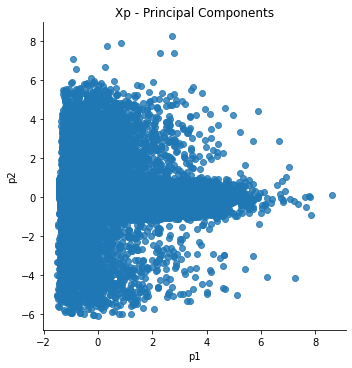

In [20]:
sns.lmplot(data=Xp,x='p1',y='p2',fit_reg=False)                                                      
fig = plt.gca()
fig.set_title("Xp - Principal Components")

In [21]:
Xp.iplot(kind = 'scatter3d',x='p1',y='p2',z='p3')

## s-SNE

In [22]:
#Xs_sample = Xs.sample(frac=.30)

In [23]:
#tsne = TSNE(n_components=3, perplexity=10)
#Xt  = pd.DataFrame(tsne.fit_transform(Xs),columns=['d1','d2','d3'])

In [24]:
#sns.lmplot(data=Xt,x='d1',y='d2',fit_reg=False)

In [25]:
#Xt.iplot(kind = 'scatter3d',x='d1',y='d2',z='d3')

## Regla del codo

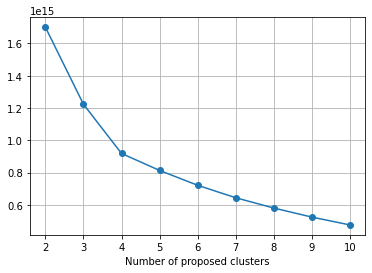

In [26]:
# Elbow-Rule to identify a possible number of clusters
lst_inertia = []
for k in range(2,11):
    cl = KMeans(n_clusters=k)
    cl.fit(df_modelo)
    lst_inertia.append(cl.inertia_)

plt.plot(range(2,11),lst_inertia,marker='o')
plt.grid(True)
plt.xlabel('Number of proposed clusters')

fig_1 = plt.gca()

## Modelo k-means

In [27]:
km = KMeans(n_clusters=4,max_iter=800)

In [28]:
km.fit(Xp)
#km.fit(df_modelo)

KMeans(max_iter=800, n_clusters=4)

In [29]:
df['cl_km'] = df_modelo['cl_km'] = Xmm['cl_km'] = Xs['cl_km'] = Xp['cl_km'] = km.fit_predict(Xp)
#=Xt['cl_km']

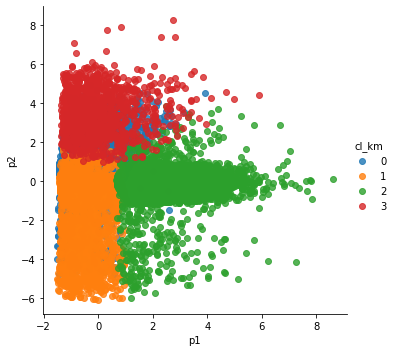

In [30]:
sns.lmplot(data=Xp,x='p1',y='p2',fit_reg=False,hue='cl_km')
plt.show()

In [31]:
Xp['cl_km'] = Xp['cl_km'].astype('str')
#Xt['cl_km'] = Xt['cl_km'].astype('str')

In [32]:
Xp.sample(frac=.1).iplot(kind = 'scatter3d',x='p1',y='p2',z='p3',categories='cl_km')
#Xt.iplot(kind = 'scatter3d',x='d1',y='d2',z='d3',categories='cl_km')

In [33]:
modelo = df_modelo.groupby('cl_km').mean().reset_index()

In [34]:
modelo#.to_excel('MODELO2.xlsx',index=False)

,cl_km,tot_transacciones_anio,tot_transacciones_medicas_anio,gastomed_vs_gasto,gastomed_vs_ingreso,num_transacciones_dvisual,num_transacciones_dauditiva,num_transacciones_dmotriz
0,0,384103.842900,280445.518798,0.902837,0.901372,1350.066969,5615.292492,15377.133882
1,1,147286.953281,225907.983369,0.880882,0.870629,1083.367668,13468.699660,104.269000
2,2,247406.283413,242630.039179,3.127273,3.064332,1835.894054,8970.717051,2499.593138
3,3,247277.530504,255755.736516,1.225791,1.273038,333843.411141,1802.146773,4593.694076


In [35]:
modelo.style.background_gradient(cmap='Blues')#.to_excel('MODELO2_pintado.xlsx',index=False)

,cl_km,tot_transacciones_anio,tot_transacciones_medicas_anio,gastomed_vs_gasto,gastomed_vs_ingreso,num_transacciones_dvisual,num_transacciones_dauditiva,num_transacciones_dmotriz
0,0,384103.842900,280445.518798,0.902837,0.901372,1350.066969,5615.292492,15377.133882
1,1,147286.953281,225907.983369,0.880882,0.870629,1083.367668,13468.699660,104.269000
2,2,247406.283413,242630.039179,3.127273,3.064332,1835.894054,8970.717051,2499.593138
3,3,247277.530504,255755.736516,1.225791,1.273038,333843.411141,1802.146773,4593.694076


In [36]:
modelo_perf = df[lst_var+['flag_dvisual','flag_dmotriz','flag_dauditivo','cl_km']].groupby('cl_km').mean().reset_index()

In [37]:
modelo_perf.style.background_gradient(cmap='Blues')#.to_excel('MODELO2_pintado_flags.xlsx',index=False)

,cl_km,tot_transacciones_anio,tot_transacciones_medicas_anio,gastomed_vs_gasto,gastomed_vs_ingreso,num_transacciones_dvisual,num_transacciones_dauditiva,num_transacciones_dmotriz,flag_dvisual,flag_dmotriz,flag_dauditivo
0,0,384103.842900,280445.518798,0.902837,0.901372,1350.066969,5615.292492,15377.133882,0.013427,0.057514,0.027918
1,1,147286.953281,225907.983369,0.880882,0.870629,1083.367668,13468.699660,104.269000,0.012473,0.002638,0.048954
2,2,247406.283413,242630.039179,3.127273,3.064332,1835.894054,8970.717051,2499.593138,0.016460,0.013910,0.035934
3,3,247277.530504,255755.736516,1.225791,1.273038,333843.411141,1802.146773,4593.694076,1.000000,0.016799,0.014147


## Variables

In [ ]:
kb = SelectKBest(k=6, score_func=f_classif)

In [ ]:
kb.fit(df[varc], df_modelo['cl_km'])

In [ ]:
ls_best = [x for x, y in zip(varc, kb.get_support()) if y]

In [ ]:
ls_best